In [ ]:
!pip install --upgrade transformers


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.1/40.1 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 74.6 MB/s eta 0:00:00
  Attempting uninstall: transformers
    Found existing installation: transformers 4.56.1
    Uninstalling transformers-4.56.1:
      Successfully uninstalled transformers-4.56.1


In [ ]:
!pip install datasets

In [ ]:
!pip install torch

In [ ]:
!pip install pandas

In [ ]:
!pip install matplotlib seaborn

**PROGETTO IA: CLASSIFICAZIONE DEL RATING**

----------------------------------





Questo progetto ha come obiettivo la classificazione automatica del punteggio (da 1 a 5 stelle) associato alle recensioni di libri, utilizzando il dataset Amazon Data Science Book Reviews. La domanda di ricerca che guida il lavoro è la seguente:

"In che modo il fine-tuning di un modello di linguaggio pre-addestrato può migliorare le prestazioni nella previsione del rating di una recensione testuale?"

Attraverso l’adattamento (fine-tuning) del modello DistilBERT-base-uncased su un corpus di recensioni reali, il progetto intende dimostrare come i modelli Transformer possano apprendere le sfumature linguistiche che distinguono una recensione da 1 stella rispetto a una da 5, superando le tradizionali tecniche di sentiment analysis binaria.

**IL DATASET:**
-------------------------------
Questo dataset contiene 20.647 recensioni Amazon per 836 libri di data science. Ogni recensione è composta dal testo e dal rating (numero di stelle da 1 a 5).

# **FASE 1: DATA PRE-PROCESSING**
-----------------------------------
**Caricamento e preparazione dei dati:**

1. Carico il dataset

2. Analisi esplorativa

3. Divisione in train, validation e test

4. Pulizia dati

5. Analisi della lunghezza delle recensioni

6. Bilanciamento delle classi tecnica di undersampling

**Step 1:** carico a preparo il dataset

In questa fase iniziale,  carico il dataset. Successivamente converto il dataset in un dataframe di pandas per una manipolazione più semplice e intuitiva.

In [ ]:
from google.colab import files
uploaded = files.upload()


Saving Amazon Reviews Science.csv to Amazon Reviews Science.csv


In [ ]:
import pandas as pd

#carico il file csv in una dataframe
df_reviews = pd.read_csv('Amazon Reviews Science.csv')

#visualizzo le prime righe del dataframe
df_reviews.head()


,stars,comment,book_url
0,5.0,"Let me say at the outset of this review, that ...",https://www.amazon.com/dp/1492041130
1,1.0,Its Capitalism at its best. I read the book fr...,https://www.amazon.com/dp/1492041130
2,5.0,If you're looking to get started with data sci...,https://www.amazon.com/dp/1492041130
3,4.0,"In general, this is a good book. It covers a w...",https://www.amazon.com/dp/1492041130
4,5.0,I was an academic data scientist decades befor...,https://www.amazon.com/dp/1492041130


**STEP 2:** Analisi esplorativa


Qui, calcolo la distribuzione del rating (starts) del dataset e creo un grafico a barre per visualizzare tale distribuzione. Questo passaggio mi aiuterà a:

- Capire la struttura del dataset

- Identificare lo sbilanciamento delle classi, che è un problema molto comune nei dataset di recensioni.

- Guidare le scelte di preprocessing e training

/tmp/ipython-input-2037878412.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=rating_count.index, y=rating_count.values, palette="mako")


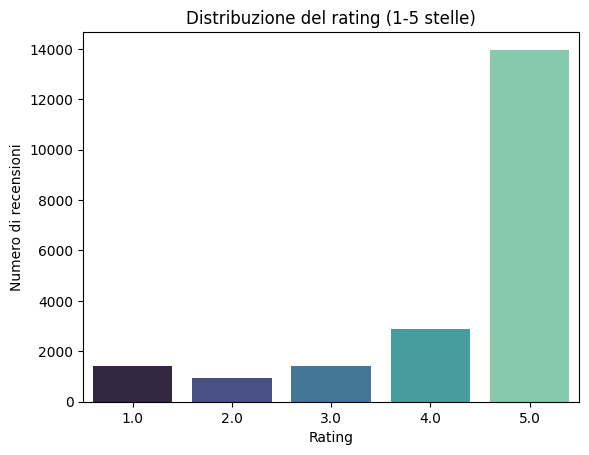

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

#conta le recensioni per ogni punteggio
rating_count= df_reviews['stars'].value_counts().sort_index()

#Visualizzazione grafica della distribuzione
sns.barplot(x=rating_count.index, y=rating_count.values, palette="mako")
plt.title('Distribuzione del rating (1-5 stelle)')
plt.xlabel('Rating')
plt.ylabel('Numero di recensioni')
plt.show()

Analizzando il grafico, il dataset presenta un numero maggiore di recensioni a 5 stelle evidenziando una distribuzione delle classi non uniforme cioè le classi non sono bilanciate.

**STEP 3:** Divisione in Training set, Validation e Test

Qui l'obiettivo è dividere il datset in 3 sottoinsiemi. Questo passaggio è fondamentale per garantire che il modello venga addestrato, validato e testato in modo corretto e imparziale:

- Train set: usato per addestrare il modello

- Validation set: usato per ottimizzare i parametri e prevenire overfitting

- Test set: usato per valutare le performance finali del modello su dati mai visti

In [ ]:
from sklearn.model_selection import train_test_split

# 1) Split iniziale stratificato per ottenere 80/10/10
train_val, test = train_test_split(
    df_reviews,
    test_size=0.10,
    stratify=df_reviews['stars'],
    random_state=42
)

train, val = train_test_split(
    train_val,
    test_size=0.1111111111,   #  10% del totale
    stratify=train_val['stars'],
    random_state=42
)

print('Dimensioni del set di addestramento:',train.shape)
print('Dimensioni del set di validazione:',val.shape)
print('Dimensioni del set di test:',test.shape)

Dimensioni del set di addestramento: (16517, 4)
Dimensioni del set di validazione: (2065, 4)
Dimensioni del set di test: (2065, 4)


**STEP 4:** Pulizia dei dati e conversione del rating 0-4 (1-5 stars)

In [ ]:
# assegno label prima a tutti gli split (-1 perche il modello richiede la conversione delle etichette 0-4)
train['label'] = train['stars'].astype(int) - 1
val['label']   = val['stars'].astype(int) - 1
test['label']  = test['stars'].astype(int) - 1

# Pulizia SOLO sul train (esempio: rimuovo commenti vuoti e testi <= 1 parola)
train_clean = train[train['comment'].notnull() & (train['comment'].str.strip() != '')].copy()
train_clean['n_words'] = train_clean['comment'].apply(lambda x: len(str(x).split()))
train_clean = train_clean[train_clean['n_words'] > 1].copy()

print("Train per classe:\n", train['label'].value_counts().sort_index())
print("Val per classe:\n",   val['label'].value_counts().sort_index())
print("Test per classe:\n",  test['label'].value_counts().sort_index())

Train per classe:
 label
0     1144
1      743
2     1145
3     2315
4    11170
Name: count, dtype: int64
Val per classe:
 label
0     143
1      93
2     143
3     290
4    1396
Name: count, dtype: int64
Test per classe:
 label
0     143
1      93
2     143
3     289
4    1397
Name: count, dtype: int64


**STEP 4:** Analisi della lunghezza delle recensioni

Qui, analizzo la lunghezza del testo che mi aiuterà a scegliere la lunghezza massima per la tokenizzazione (es:max_lenght= 126 o 256)

count    20647.000000
mean        87.494212
std        144.825226
min          1.000000
25%         20.000000
50%         46.000000
75%        101.000000
max       4868.000000
Name: review_length, dtype: float64


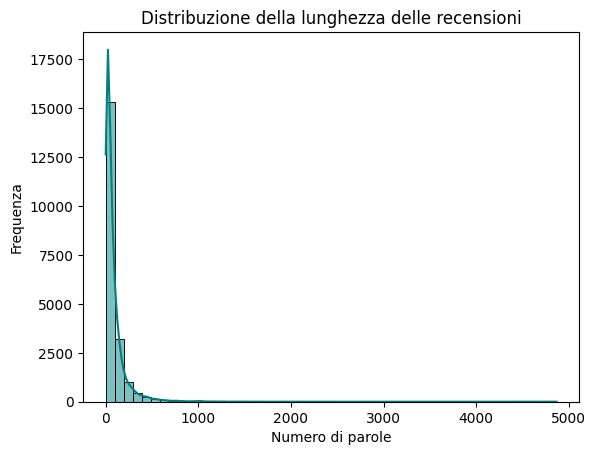

In [ ]:
# Aggiungi colonna con lunghezza del testo
df_reviews['review_length'] = df_reviews['comment'].apply(lambda x: len(str(x).split()))

# Statistiche
print(df_reviews['review_length'].describe())

# Visualizzazione
sns.histplot(df_reviews['review_length'], bins=50, kde=True, color='teal')
plt.title("Distribuzione della lunghezza delle recensioni")
plt.xlabel("Numero di parole")
plt.ylabel("Frequenza")
plt.show()


Interpretazione dei risultati

- count: (numero totale di recensioni analizzate) 20.647

- mean: (lunghezza media delle recensioni) ogni recensione ha in media 87.5 parole

- std: (deviazione standard) c'è molta variabilità, alcune recensioni sono molto più lunghe o più corte

- min:	(lunghezza minima)	la recensione più corta ha 1 parola. NB:probabilmente da filtrare

- 25%: il 25% delle recensioni ha meno di 20 parole

- 50%: il 50% ha meno di 46 parole (quindi la metà è piuttosto breve)

- 75%: il 75% ha meno di 101 parole

- max: (Lunghezza massima)	la recensione più lunga ha 4868 parole (molto probabilmente un outlier, ovvero un **valore anomalo**)             

**Considerazioni personali:** Nel dataset, la recensione più corta ha 1 parola e la più lunga ne ha 4868. Entrambe sono outlier rispetto alla distribuzione generale, e vanno valutate con attenzione in base all'obiettivo di questo progetto: classificare il rating di una recensione testuale usando DistilBERT.  Si procede eliminando le recensioni con una sola parola e lasciando la più lunga poichè verrà troncata durante il processione di tokenizzazione (impostando max_lenght=256 e truncation=True)

**STEP 5:** Bilanciamento delle classi

In questa fase si procede con il bilanciamento delle classi tramite la tecnica dell'Undersampling.



In [ ]:
# Undersampling del train fino alla classe minima presente nel train_clean
train_min = train_clean['label'].value_counts().min()
train_bal = train_clean.groupby('label', group_keys=False).apply(lambda g: g.sample(n=train_min, random_state=42)).reset_index(drop=True)

# Mantengo val e test senza bilanciamento
val_bal = val.copy()
test_bal = test.copy()

# Controllo finale: stampo i conteggi per classe
print("Train per classe:\n", train_bal['label'].value_counts().sort_index())
print("Val per classe:\n",   val_bal['label'].value_counts().sort_index())
print("Test per classe:\n",  test_bal['label'].value_counts().sort_index())

# Verifica dimensioni assolute
print("Totali -> train:", len(train_bal), " val:", len(val_bal), " test:", len(test_bal))


Train per classe:
 label
0    741
1    741
2    741
3    741
4    741
Name: count, dtype: int64
Val per classe:
 label
0     143
1      93
2     143
3     290
4    1396
Name: count, dtype: int64
Test per classe:
 label
0     143
1      93
2     143
3     289
4    1397
Name: count, dtype: int64
Totali -> train: 3705  val: 2065  test: 2065


/tmp/ipython-input-307596932.py:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  train_bal = train_clean.groupby('label', group_keys=False).apply(lambda g: g.sample(n=train_min, random_state=42)).reset_index(drop=True)


- Il train_bal ha 741 esempi per ciascuna classe → quindi è bilanciato tramite undersampling.

- val e test mostrano distribuzioni sbilanciate, con molte più recensioni nella classe 4  perché validation e test devono riflettere la distribuzione reale.

Controlli per valutare i conteggi per classe nei vari split

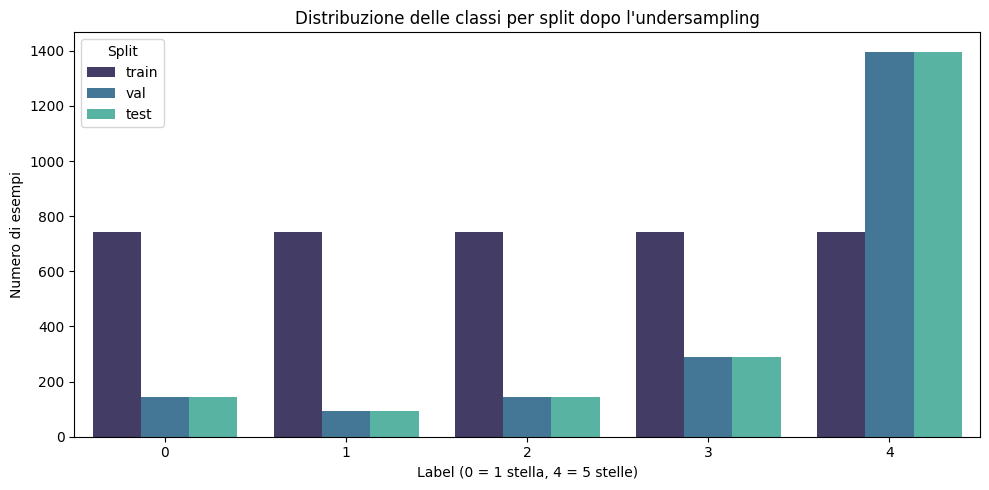

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


# Aggiungo una colonna 'split' per identificare l'origine di ciascuna riga
train_plot = train_bal.assign(split='train')
val_plot   = val_bal.assign(split='val')
test_plot  = test_bal.assign(split='test')

# Unisco i tre set in un unico DataFrame per la visualizzazione
combined = pd.concat([train_plot, val_plot, test_plot], ignore_index=True)


# Grafico: barre affiancate per label, separate per split
plt.figure(figsize=(10,5))
sns.countplot(x='label', hue='split', data=combined, palette='mako',order=sorted(combined['label'].unique()))
plt.title('Distribuzione delle classi per split dopo l\'undersampling')
plt.xlabel('Label (0 = 1 stella, 4 = 5 stelle)')
plt.ylabel('Numero di esempi')
plt.legend(title='Split')
plt.tight_layout()
plt.show()


In [ ]:
#elimino eventuali valori nulli rimasti
train_bal = train_bal.dropna(subset=["label"])

# **FASE 2:PROCESSING**


**TOKENIZZAZIONE, CREAZIONE DEI TENSORI E DEFINIZIONE DEL MODELLO PER L'ADDESTRAMENTO**


--------------------------------
Questa fase è caratterizzata dai seguenti passaggi:

1. tokenizzazione e preparazione dei dati

2. creazione dei tensori di input

3. definizione del modello e addestramento

4. Valutazione sul test set

5. Analisi eventuali errori (anomalie)







**STEP 1:** Tokenizzazione e preparazione dei dati

La tokenizzazione è il processo che trasforma il testo in numeri (token), cioè in una sequenza che il modello può comprendere. DistilBERT non legge parole, ma ID numerici associati a sottoparti di parole (subword tokens). Il processo si divide nelle seguenti fasi:

- importare e caricare il tokenizer (Autotokenizer: riconosce automaticamente il tokenizer corretto in base al nome del modello. Caricando distil-bert-uncased, viene usato DistilBertTokenizerFast internamente)

- definire la funzione di tokenizzazione

- applicare la funzione ai tre set: training, validation e test

L'obiettivo è convertire le recensioni testuali in input numerici (input_ids, attention_mask) compatibili con il modello DistilBERT, usando un tokenizer automatico e flessibile.

In [ ]:
#importo e carico il tokenizer
from transformers import AutoTokenizer

tokenizer= AutoTokenizer.from_pretrained('distilbert-base-uncased')


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

In [ ]:
# Funzione di tokenizzazione in batch che restituisce il dizionario tokenizzato
def batch_tokenize_texts(texts, tokenizer, max_length=256):
    tokenized = tokenizer(
        texts,
        padding="max_length",
        truncation=True,
        max_length=max_length,
        return_attention_mask=True,
        return_tensors=None
    )
    # tokenized è un dict con liste per 'input_ids' e 'attention_mask'
    return tokenized

In [ ]:
#applico la funzione ai set
# testi come liste
train_texts = train_bal['comment'].astype(str).tolist()
val_texts   = val_bal['comment'].astype(str).tolist()
test_texts  = test_bal['comment'].astype(str).tolist()

# tokenizzazione batch
train_tok = batch_tokenize_texts(train_texts, tokenizer, max_length=256)
val_tok   = batch_tokenize_texts(val_texts,   tokenizer, max_length=256)
test_tok  = batch_tokenize_texts(test_texts,  tokenizer, max_length=256)

# verifica rapida
print("Esempi tokenizzati:", len(train_tok['input_ids']), len(val_tok['input_ids']), len(test_tok['input_ids']))
print("Lunghezza input_ids esempio:", len(train_tok['input_ids'][0]))


Esempi tokenizzati: 3705 2065 2065
Lunghezza input_ids esempio: 256


In [ ]:
print(train_tok.keys())
print(val_tok.keys())
print(test_tok.keys())

KeysView({'input_ids': [[101, 2045, 2024, 1055, 3490, 29519, 2015, 1997, 8608, 6179, 2791, 2005, 2035, 2496, 6062, 1012, 2021, 2023, 3834, 10753, 2003, 2969, 9063, 1999, 2010, 2219, 8117, 21823, 6679, 1012, 2018, 2002, 2018, 1037, 2613, 3559, 2040, 2071, 2486, 2032, 2000, 2131, 2000, 1996, 2391, 1997, 2169, 2930, 1010, 2002, 2453, 2031, 2018, 1037, 2190, 14939, 1012, 2065, 2017, 2024, 6224, 6742, 6040, 1010, 2079, 2025, 4965, 2023, 2338, 1012, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0

tre dizionari con:
- "input_ids": una lista di liste di interi, dove ogni sottolista rappresenta i token numerici di una recensione.

- "attention_mask": una lista di liste di 0 e 1, che indica quali token sono reali e quali sono padding.

In [ ]:
print(tokenizer.decode(train_tok['input_ids'][0]))
print(train_tok['attention_mask'][0])

print(tokenizer.decode(val_tok['input_ids'][0]))
print(val_tok['attention_mask'][0])

print(tokenizer.decode(test_tok['input_ids'][0]))
print(test_tok['attention_mask'][0])

[CLS] there are snippets of tactical usefulness for all married couples. but this academic researcher is self absorbed in his own minutiae. had he had a real editor who could force him to get to the point of each section, he might have had a best seller. if you are seeking practical advice, do not buy this book. [SEP] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [P

**STEP 2:** Creazione dei tensori di input

Qui, vengono creati i tensori di input con l'obiettivo di associare gli input tokenizzati (input_ids, attention_mask) alle etichette (label) e impacchettarli in un dataset compatibile con PyTorch o Hugging Face Trainer:

- conversione delle etichette in tensori: perchè il modello ha bisogno che le etichette siano in formato numerico. Questo rende possibile calcolare la funzione di perdita (CrossEntropyLoss) durante il training
-  creazione dei dataset da utilizzare nell’addestramento, validazione e test del modello,  utilizzando la classe Dataset della libreria Hugging Face datasets. Questa scelta è motivata dalla piena compatibilità con il modello DistilBERT, già integrato nella piattaforma Hugging Face. Dopo aver effettuato la tokenizzazione dei testi e convertito le etichette in tensori PyTorch, ho associato le etichette (labels) direttamente ai dizionari contenenti gli input tokenizzati (input_ids e attention_mask). Successivamente, ho utilizzato il metodo Dataset.from_dict() per creare tre oggetti dataset distinti: train_dataset, val_dataset e test_dataset.

- istanzio i dataset

In [ ]:
from datasets import Dataset

# Costruisco i dizionari con input_ids, attention_mask e label
train_dict = {
    "input_ids": train_tok["input_ids"],
    "attention_mask": train_tok["attention_mask"],
    "label": train_bal["label"].astype(int).tolist()
}

val_dict = {
    "input_ids": val_tok["input_ids"],
    "attention_mask": val_tok["attention_mask"],
    "label": val_bal["label"].astype(int).tolist()
}

test_dict = {
    "input_ids": test_tok["input_ids"],
    "attention_mask": test_tok["attention_mask"],
    "label": test_bal["label"].astype(int).tolist()
}

# Creo i dataset con il metodo dataset.from_dict()
train_dataset = Dataset.from_dict(train_dict)
val_dataset   = Dataset.from_dict(val_dict)
test_dataset  = Dataset.from_dict(test_dict)

# Imposto il formato torch per Trainer
train_dataset.set_format(type="torch", columns=["input_ids", "attention_mask", "label"])
val_dataset.set_format(type="torch", columns=["input_ids", "attention_mask", "label"])
test_dataset.set_format(type="torch", columns=["input_ids", "attention_mask", "label"])

# Verifica rapida
print("Train:", len(train_dataset), "Val:", len(val_dataset), "Test:", len(test_dataset))
print("Esempio train:", train_dataset[0])


Train: 3705 Val: 2065 Test: 2065
Esempio train: {'input_ids': tensor([  101,  2045,  2024,  1055,  3490, 29519,  2015,  1997,  8608,  6179,
         2791,  2005,  2035,  2496,  6062,  1012,  2021,  2023,  3834, 10753,
         2003,  2969,  9063,  1999,  2010,  2219,  8117, 21823,  6679,  1012,
         2018,  2002,  2018,  1037,  2613,  3559,  2040,  2071,  2486,  2032,
         2000,  2131,  2000,  1996,  2391,  1997,  2169,  2930,  1010,  2002,
         2453,  2031,  2018,  1037,  2190, 14939,  1012,  2065,  2017,  2024,
         6224,  6742,  6040,  1010,  2079,  2025,  4965,  2023,  2338,  1012,
          102,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
  

Ogni esempio è un dizionario con input_ids, attention_mask e label, già convertito in tensori PyTorch, così ogni esempio ha:

- gli input tokenizzati:'input_ids'
È una lista di token numerici che rappresentano la recensione. Inizia con [101] (token [CLS]) e termina con [102] (token [SEP]), come previsto. I numeri successivi sono token subword generati dal tokenizer.I tanti 0 alla fine sono padding, perché la recensione è più corta di max_length=256.

- la maschera di attenzione: È una lista di 1 e 0:

  - 1 indica token reali (da [CLS] fino a [SEP])
  - 0 indica token di padding

- la classe associata: (labels)il valore che rappresenta la classe associata a quella recensione.


**STEP 3:** Definizione del modello e addestramento

In questa fase l'obiettivo è di:
- Caricare il modello DistilBertForSequenceClassification

- Impostare il numero di classi (5, da 0 a 4)

- Configurare il Trainer con parametri di addestramento

- Preparare il training e la validazione

In [ ]:
from transformers import DistilBertForSequenceClassification, Trainer, TrainingArguments
import numpy as np
from sklearn.metrics import accuracy_score

#carico il modello DistilBertForSequenceClassification e imposto il numero di classi
model= DistilBertForSequenceClassification.from_pretrained('distilbert-base-uncased',num_labels=5)

#configurazione dei parametri di addestramento
training_args= TrainingArguments(
    output_dir='./results',            #salvare il modello
    eval_strategy="epoch",             #valuta alla fine di ogni epoca
    save_strategy='epoch',             #salva alla fine di ogni epoca
    num_train_epochs=3,                #numero epoche 3 per evitare overfitting
    per_device_train_batch_size=8,     #batch bilanciato per stabilità
    per_device_eval_batch_size=8,
    metric_for_best_model='accuracy',  #accuracy come riferimento
    logging_strategy="steps",
    logging_steps=50,
    report_to="none"	                 #disattivare logging esterni
)


#definisco le metriche di valutazione
def compute_metrics(pred):
  labels= pred.label_ids
  preds=np.argmax(pred.predictions,axis=1)
  accuracy=accuracy_score(labels,preds)
  return{'accuracy':accuracy_score(labels,preds)}


#creo il trainer
trainer=Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    compute_metrics=compute_metrics,
)

#avvio l'addestramento
trainer.train()


model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy
1,1.176900,0.823254,0.669249
2,0.952700,0.961467,0.607264
3,0.629300,1.110352,0.601453


TrainOutput(global_step=1392, training_loss=0.9291372600643114, metrics={'train_runtime': 325.0968, 'train_samples_per_second': 34.19, 'train_steps_per_second': 4.282, 'total_flos': 736226954611200.0, 'train_loss': 0.9291372600643114, 'epoch': 3.0})

**STEP 4:** Valutazione sul test set

Dopo aver valutato le metriche durante la fase di allenamento (training loss, validation loss e Accuracy), si procede con la valutazione sul set di test per capire se il modello generalizza bene su dati mai visti, simulando l’uso reale.

In [ ]:
# Valutazione automatica con Trainer
test_metrics = trainer.evaluate(eval_dataset=test_dataset)
print("Valutazione automatica sul test set:")
print(test_metrics)

Valutazione automatica sul test set:
{'eval_loss': 1.153118371963501, 'eval_accuracy': 0.5840193704600485, 'eval_runtime': 15.6454, 'eval_samples_per_second': 131.988, 'eval_steps_per_second': 16.554, 'epoch': 3.0}


**STEP 5:** Analisi degli errori o anomalie

Questo step mi aiuta a comprendere dove il modello sbaglia e perché, per migliorarlo o interpretarlo meglio.

In [ ]:
from sklearn.metrics import classification_report


preds_output=trainer.predict(test_dataset)
preds=np.argmax(preds_output.predictions,axis=1)
labels=preds_output.label_ids

print(classification_report(preds,labels))


              precision    recall  f1-score   support

           0       0.56      0.48      0.52       166
           1       0.49      0.28      0.36       162
           2       0.42      0.31      0.36       191
           3       0.47      0.24      0.32       573
           4       0.63      0.91      0.75       973

    accuracy                           0.58      2065
   macro avg       0.52      0.45      0.46      2065
weighted avg       0.55      0.58      0.54      2065



- Accuracy = 0.58 → il modello classifica correttamente il 58% delle recensioni.

- Macro avg (F1 = 0.46) → media semplice tra le classi, mostra che le classi meno rappresentate hanno performance più basse.

- Weighted avg (F1 = 0.54) → media ponderata per supporto: il modello è influenzato positivamente dalla classe 4, che ha il maggior numero di esempi.

In [ ]:
#salvo il modello per poi testarlo con la pipeline
trainer.save_model("best_rating_classifier")


**Interpretazione del report della classificazione:**


- Il modello funziona bene per le recensioni a 5 stelle, ma fatica con le classi intermedie (1, 2 ,3 stelle).

- Questo è coerente con la distribuzione sbilanciata del dataset: la classe 4 ha molti più esempi, quindi il modello la impara meglio.

- Le classi 1, 2 e 3 hanno recall molto basso, quindi il modello tende a non riconoscerle quando appaiono.

**Metriche Globali:**
- Accuracy = 0.58 → il modello classifica correttamente il 58% delle recensioni.

- Macro avg (F1 = 0.46) → media semplice tra le classi, mostra che le classi meno rappresentate hanno performance più basse.

- Weighted avg (F1 = 0.54) → media ponderata per supporto: il modello è influenzato positivamente dalla classe 4, che ha il maggior numero di esempi.

**Commento Generale:** "Il modello generalizza bene sulle recensioni a 5 stelle, con un recall del 91%. Tuttavia, mostra difficoltà nel riconoscere le classi intermedie, in particolare le recensioni a 2 e 3 stelle. Questo è dovuto allo sbilanciamento del dataset, che ho rispettato nel test set per garantire una valutazione realistica. L'accuracy complessiva è del 58%, e il F1 ponderato è 0.54, che considero una base solida per miglioramenti futuri."


#**FASE 3:POST-PROCESSING**
Adesso si procede con fase di post-processing:

1. Inferenza con Hugging Face Pipeline

2. Utilizzo la funzione Softmax per visualizzare tutte le probabilità



------------------------------
**STEP 1:** Inferenza con Hugging Face Pipeline

Qui, utilizzo il modello fine-tuning per classificare una recensione reale. Viene data in input una frase, e  restituisce il voto stimato (da 1 a 5 stelle) insieme a quanto è sicuro della scelta. È il primo modo per vedere il modello “in azione”, come se fosse già integrato in un’applicazione.



In [ ]:
from transformers import pipeline, AutoTokenizer
import torch

# Carico il tokenizer e il modello fine-tuned
tokenizer = AutoTokenizer.from_pretrained("distilbert-base-uncased")
model.eval()  # metto il modello in modalità valutazione

# Creo la pipeline di inferenza
classifier = pipeline("text-classification", model=model, tokenizer=tokenizer, top_k=None)

# Funzione per eseguire inferenza su un esempio del test set
def print_test_prediction(idx):
    comment = test_bal.iloc[idx]["comment"]
    true_label = test_bal.iloc[idx]["label"]

    # Eseguo la predizione
    results = classifier(comment, truncation=True, max_length=256)

    # Trovo la classe con il punteggio più alto
    best = max(results[0], key=lambda x: x["score"])
    predicted_label = int(best["label"].split("_")[-1])

    print(f"\n>>> Recensione:\n{comment[:300]}...")
    print(f">>> Etichetta vera: {true_label}")
    print(f">>> Predizione del modello: {predicted_label}")
    print(f">>> Confidenza: {best['score']:.4f}")


for i in range(20):
    print_test_prediction(i)



Device set to use cuda:0



>>> Recensione:
great for a newbe to R...
>>> Etichetta vera: 4
>>> Predizione del modello: 4
>>> Confidenza: 0.6008

>>> Recensione:
The book for me, was a compact and meant for students and teachers alike, combining Statistics with R. I am going to use it as the base for teaching Statistics in the context of Data Analytics/Science....
>>> Etichetta vera: 4
>>> Predizione del modello: 4
>>> Confidenza: 0.5189

>>> Recensione:
Easy and quick to read. 'Beginner' level presentation of a new concept. Repetitiveness is likely intentional to help learn a new way of thinking....
>>> Etichetta vera: 4
>>> Predizione del modello: 3
>>> Confidenza: 0.8714

>>> Recensione:
This book is a must read.  It will change how you think about modern medicine and bring to light the fraud that is germ theory.  I can't recommend this book enough.  It will  make you angry at how we've been deceived, yet make you happy to learn the truth.  Every household should have a copy of this...
>>> Etichetta vera: 4
>

**INTERPRETAZIONE OUTPUT:**

- Predizioni corrette: Il modello predice correttamente molte recensioni con classe 4 (5 stelle), spesso con confidenza alta (>0.90). Questo conferma che la classe dominante è ben appresa.

- Errori su classi intermedie: alcune recensioni con etichetta 3 o 2 vengono classificate come 2 o 4, con confidenza moderata. Questo riflette la difficoltà del modello nel distinguere le sfumature tra classi vicine.

- Confidenza alta anche negli errori: in alcuni casi (es. etichetta vera 4 → predizione 0), il modello è molto sicuro di una predizione sbagliata. Questo è tipico nei modelli addestrati su dati sbilanciati.

**STEP 2:** Softmax per visualizzare tutte le probabilità

Qui si va più a fondo: invece di vedere solo il voto finale, chiedo al modello di mostrare quanto crede in ogni possibile voto. Ottiengo le percentuali per tutte le 5 classi, così posso capire se la scelta è netta o se il modello era indeciso tra due voti vicini. È utile per analizzare meglio il comportamento del modello e per rendere le sue decisioni più trasparenti.

In [ ]:
from transformers import AutoTokenizer, AutoModelForSequenceClassification
from scipy.special import softmax
import torch
import pandas as pd

# Assicurati che il modello sia in modalità valutazione
model.eval()

# Lista dei risultati
results = []

# Ciclo su commenti e label veri
for comment, label in zip(test_bal["comment"], test_bal["label"]):
    # Tokenizzazione e invio alla stessa device del modello
    inputs = tokenizer(comment, return_tensors="pt", truncation=True, padding="max_length", max_length=256)
    inputs = {k: v.to(model.device) for k, v in inputs.items()}

    # Predizione
    with torch.no_grad():
        logits = model(**inputs).logits

    # Softmax e classe predetta
    probs = softmax(logits.cpu().numpy(), axis=1)[0]
    predicted_class = int(probs.argmax()) + 1
    true_class = int(label) + 1

    # Salvo tutto
    results.append([comment, predicted_class, [round(p, 4) for p in probs], true_class])

# Creo il DataFrame finale
df_results = pd.DataFrame(results, columns=["comment", "predicted_class", "probs", "true_class"])
df_results.head(20)


,comment,predicted_class,probs,true_class
0,great for a newbe to R,5,"[0.0029, 0.0028, 0.0133, 0.3802, 0.6008]",5
1,"The book for me, was a compact and meant for s...",5,"[0.0027, 0.0031, 0.0195, 0.4558, 0.5189]",5
2,Easy and quick to read. 'Beginner' level prese...,4,"[0.0018, 0.0041, 0.0546, 0.8714, 0.0681]",5
3,This book is a must read. It will change how ...,5,"[0.0062, 0.0025, 0.0066, 0.0451, 0.9395]",5
4,I read this about a decade ago and have had ti...,1,"[0.9474, 0.0398, 0.005, 0.0021, 0.0057]",5
5,Interesting correlation of historical events a...,4,"[0.0015, 0.0024, 0.018, 0.7942, 0.1838]",4
6,The textbook came in an orderly fashion. I fig...,3,"[0.0406, 0.0868, 0.6126, 0.1962, 0.0638]",4
7,This is a pretty evil book. It isn’t based on...,1,"[0.9559, 0.0305, 0.0053, 0.0022, 0.0061]",1
8,Excellent psychological research and content. ...,3,"[0.0043, 0.0241, 0.5385, 0.4233, 0.0097]",3
9,"A great book for statisticians, machine learni...",5,"[0.0017, 0.0015, 0.0053, 0.1854, 0.8061]",5


In [ ]:
accuracy = (df_results["predicted_class"] == df_results["true_class"]).mean()
print(f"Accuracy finale sul test set: {accuracy:.4f}")


Accuracy finale sul test set: 0.5840


- Il modello funziona bene sulle classi 5 e 1, con confidenze alte e predizioni corrette.

- Fa errori gravi su alcune recensioni a 5 stelle, predicendo 1 con altissima sicurezza (riga 4).

- Le classi intermedie (3 e 4) sono più difficili da distinguere: il modello sbaglia spesso tra 3 e 4.

- La confidenza non sempre corrisponde alla correttezza: riga 2 e riga 4.


**Dove sbaglia?**
- Classe 5 predetta come 4 (es. riga 2, 14, 18): il modello confonde recensioni molto positive con quelle solo “buone”.

- Classe 5 predetta come 1 (riga 4): errore grave con confidenza altissima → segnale di overconfidence.

- Classe 2 predetta come 1 (riga 16): errore su classe intermedia, coerente con le difficoltà viste nel report F1.